---
* **Universidad:** UOC (Universitat Oberta de Catalunya)
* **Titulación:** Master Ciencia de Datos/TFM
* **Título:** Segmentación de imágenes utilizando Redes Generativas Antagónicas
* **Actividad**: Generación modelo de detección de armas cortas y detección caja
* **Autor:** Miguel Ponce
* **Correo:** miguelalejoponce@uoc.edu
* **Fecha:** "Enero, 03 de 2023"
* **Salida**: ipynb
---
## Contexto: Detección de armas

* **Contexto:**
Modelo para la detección de armas y obtención de la posición del objeto.

* **Problema:** 
Existen diferentes conjuntos de datos disponibles sin embargo se hace uso del conjunto de datos que corresponde al grupo procesado de personas con armas cortas.

* **Solucion :** 
Se utilizara el trabajo realizado en https://github.com/idealo/image-super-resolution#additional-information, con redes GAN.
* **Entorno:** con GPU.
  

## Origen del la fuente de datos
@misc{ gun-dataset_dataset,
    title = { Gun dataset Dataset },
    type = { Open Source Dataset },
    author = { workspace },
    howpublished = { \url{ https://universe.roboflow.com/workspace-zqssx/gun-dataset } },
    url = { https://universe.roboflow.com/workspace-zqssx/gun-dataset },
    journal = { Roboflow Universe },
    publisher = { Roboflow },
    year = { 2022 },
    month = { apr },
    note = { visited on 2023-01-03 },
}

## Instalar requisitos

_(Recuerde elegir GPU en tiempo de ejecución si aún no lo ha seleccionado. Tiempo de ejecución --> Cambiar tipo de tiempo de ejecución --> Acelerador de hardware --> GPU)_

In [1]:
!python -m pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached PyYAML-6.0-cp38-cp38-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (701 kB)
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1


In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached PyYAML-5.1-cp38-cp38-linux_x86_64.whl
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 0.2.22 requires PyYAML>=5.3.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Importar Librerias

In [3]:
from roboflow import Roboflow
import torch, detectron2
import glob
from PIL import Image
import matplotlib.pyplot as plt
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.utils.visualizer import ColorMode
from detectron2.data import build_detection_test_loader

#Default trainer
from detectron2.engine import DefaultTrainer


## Mostrar caracteristicas del entorno

In [4]:
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


## Descarga conjunto de datos

In [5]:
VERSION = 12
rf = Roboflow(api_key="3rOW8xY5g1wv0JEQF2Vl")
project = rf.workspace("workspace-zqssx").project("gun-dataset")
dataset = project.version(VERSION).download("coco")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Gun-dataset-12 in coco:: 100%|██████████| 4693/4693 [00:01<00:00, 2476.12it/s]


# Train on a custom dataset

En esta sección, se muestra cómo entrenar un modelo con detectron2 en un conjunto de datos personalizado con formato COCO.

Tener en cuenta que el conjunto de datos COCO tiene la categoría "gun". Con esta herramienta podremos reconocer esta nueva clase en unos minutos.



## Preparación del conjunto de datos

In [6]:
dataset_path = "{fpath}-{fversion}".format(fpath="Gun-dataset",fversion=VERSION)
dataset_path

'Gun-dataset-12'

In [7]:
register_coco_instances("my_dataset_train", {}, f"./{dataset_path}/train/_annotations.coco.json", f"./{dataset_path}/train")
register_coco_instances("my_dataset_val", {}, f"./{dataset_path}/valid/_annotations.coco.json", f"./{dataset_path}/valid")
register_coco_instances("my_dataset_test", {}, f"./{dataset_path}/test/_annotations.coco.json", f"./{dataset_path}/test")


## Visualizar algunos ejemplos de conjunjunto de datos
Para verificar que el conjunto de datos tenga el formato correcto, visualizaremos las anotaciones de algunas muestras seleccionadas aleatoriamente:


WARNING [01/03 18:21:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 18:21:20 d2.data.datasets.coco]: Loaded 3716 images in COCO format from ./Gun-dataset-12/train/_annotations.coco.json
./Gun-dataset-12/train/178_jpg.rf.2e603c8536c00d60cad8f259d58db81f.jpg


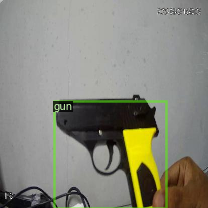

./Gun-dataset-12/train/armas--1321-_jpg.rf.7e6a7fc3ac88176825279ce3611ed809.jpg


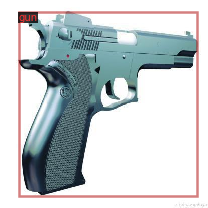

./Gun-dataset-12/train/armas--2009-_jpg.rf.b32a6e92989084a8e9371e278b9a5166.jpg


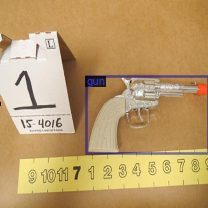

./Gun-dataset-12/train/14_jpg.rf.3e02b06192fdab6c12f6dc015eb71ca1.jpg


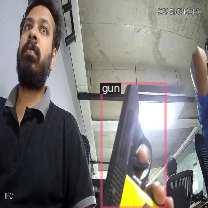

./Gun-dataset-12/train/armas--2844-_jpg.rf.b94e47ae18e6979f327c6d2ff0b13f40.jpg


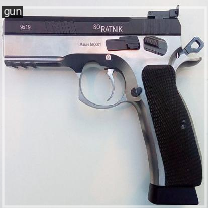

In [8]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
for d in random.sample(dataset_dicts, 5):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Entrenamiento(train data)

Ahora, utilizamos un modelo de detección de objectos faster_rcnn_X_101_32x8d_FPN_3x previamente entrenado por COCO. Se necesitan varios minutos para entrenar 800 iteraciones con una GPU.

In [9]:
instance = "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(instance))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(instance)  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 800    # 800 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/03 18:21:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/03 18:21:29 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)


[01/03 18:22:00 d2.utils.events]:  eta: 0:18:35  iter: 19  total_loss: 1.664  loss_cls: 1.098  loss_box_reg: 0.531  loss_rpn_cls: 0.01388  loss_rpn_loc: 0.009339  time: 1.4023  data_time: 0.0230  lr: 6.1816e-06  max_mem: 4236M
[01/03 18:22:29 d2.utils.events]:  eta: 0:17:31  iter: 39  total_loss: 1.4  loss_cls: 0.9475  loss_box_reg: 0.427  loss_rpn_cls: 0.008828  loss_rpn_loc: 0.008224  time: 1.4103  data_time: 0.0087  lr: 1.2425e-05  max_mem: 4236M
[01/03 18:22:59 d2.utils.events]:  eta: 0:18:31  iter: 59  total_loss: 1.301  loss_cls: 0.7758  loss_box_reg: 0.5438  loss_rpn_cls: 0.01265  loss_rpn_loc: 0.006777  time: 1.4474  data_time: 0.0086  lr: 1.8669e-05  max_mem: 4236M
[01/03 18:23:28 d2.utils.events]:  eta: 0:18:01  iter: 79  total_loss: 1.033  loss_cls: 0.5991  loss_box_reg: 0.4726  loss_rpn_cls: 0.006087  loss_rpn_loc: 0.007144  time: 1.4500  data_time: 0.0082  lr: 2.4913e-05  max_mem: 4236M
[01/03 18:23:57 d2.utils.events]:  eta: 0:17:31  iter: 99  total_loss: 0.9355  loss_cls

In [10]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inferencia y evaluación usando el modelo entrenado
Ahora, ejecutamos la inferencia con el modelo entrenado sobre el conjunto de datos de validación del armas cortas. Primero, creemos un predictor usando el modelo que acabamos de entrenar:



In [11]:
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/03 18:41:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


## Evaluación de resultados(test data)

In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[01/03 18:41:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[01/03 18:41:14 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/03 18:41:14 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/03 18:41:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 18:41:14 d2.data.datasets.coco]: Loaded 252 images in COCO format from ./Gun-dataset-12/test/_annotations.coco.json
[01/03 18:41:14 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|     0      | 0            |    gun     | 277          |
|            |              |            |              |
|   total    | 277     

OrderedDict([('bbox',
              {'AP': 57.49495282958785,
               'AP50': 89.76275566484222,
               'AP75': 61.59960929241281,
               'APs': 33.38880151751438,
               'APm': 37.460634418786285,
               'APl': 64.31992579419125,
               'AP-0': nan,
               'AP-gun': 57.49495282958785})])

# Inferencia con sobre el conjunto de test con el modelo guardado

In [13]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.80   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[01/03 18:42:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


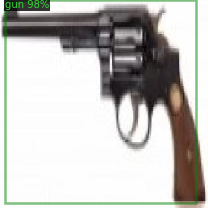

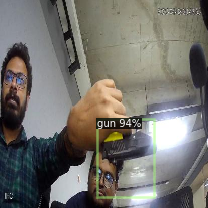

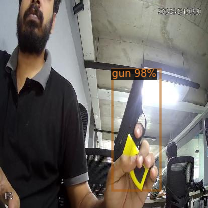

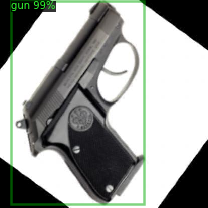

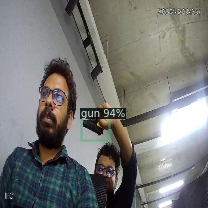

...

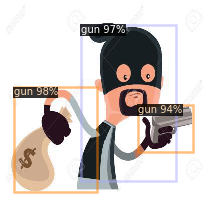

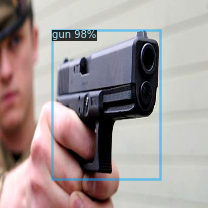

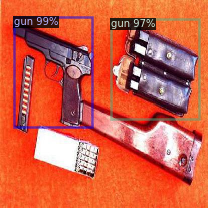

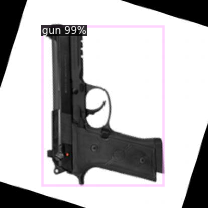

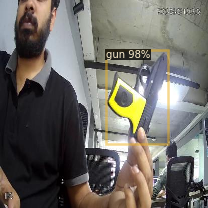

In [14]:
listImages = glob.glob('/content/Gun-dataset-12/test/*jpg')
randomImages = random.sample(listImages, 20)
for imageName in randomImages:
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

## Evaluación sobre el conjunto de datos de validación(validation data)

También podemos evaluar su rendimiento utilizando la métrica AP implementada en la API de COCO.

In [15]:
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/03 18:42:12 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [01/03 18:42:12 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/03 18:42:12 d2.data.datasets.coco]: Loaded 717 images in COCO format from ./Gun-dataset-12/valid/_annotations.coco.json
[01/03 18:42:12 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|     0      | 0            |    gun     | 765          |
|            |              |            |              |
|   total    | 765          |            |              |
[01/03 18:42:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/03 18:42:12 d2.data.common]: Serializing the dataset using: <class 'de

## Ejemplo deteccion armas cortas

In [16]:
def crop_object(image,imageName):
  """Crops an object in an image

  Inputs:
    image: PIL image
    box: one box from Detectron2 pred_boxes
  """  
  im = cv2.imread(imageName)
  outputs = predictor(im)
  boxes = outputs["instances"].pred_boxes
  # Select 1 box:
  if list(boxes):
    box = list(boxes)[0].detach().cpu().numpy()
  
    v = Visualizer(im[:, :, ::-1],
                  metadata=test_metadata, 
                  scale=0.8
                  )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(out.get_image()[:, :, ::-1])

    x_top_left = box[0]
    y_top_left = box[1]
    x_bottom_right = box[2]
    y_bottom_right = box[3]
    x_center = (x_top_left + x_bottom_right) / 2
    y_center = (y_top_left + y_bottom_right) / 2

    crop_img = image.crop((int(x_top_left), int(y_top_left), int(x_bottom_right), int(y_bottom_right)))
    return True,crop_img,box
  else:
    return False,None,None    

box [  9.826933   0.       391.51425  405.97488 ]


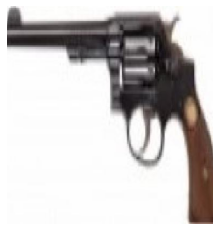

box [193.93483 237.05144 307.2632  394.978  ]


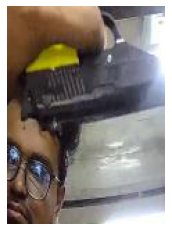

box [223.77939 138.57152 320.8189  380.3804 ]


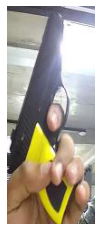

box [ 22.626379   2.777861 287.9393   408.13892 ]


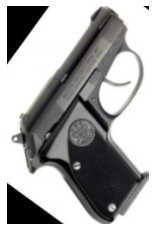

box [161.4082  217.4302  218.08635 279.212  ]


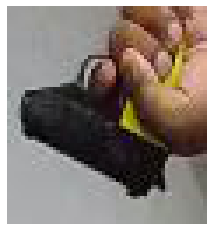

box [ 32.19217  90.46019 384.75293 372.89996]


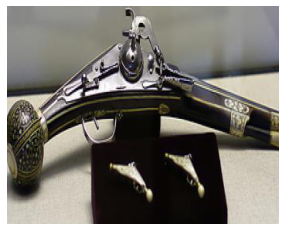

box [ 27.832773  67.75055  389.10028  314.99557 ]


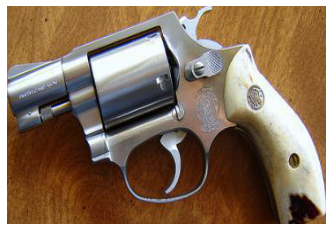

box [275.55533 180.66644 320.8121  223.7553 ]


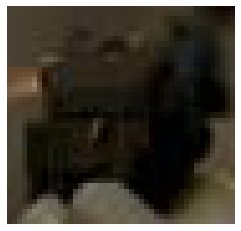

box [ 26.434797  79.45125  385.72803  301.95697 ]


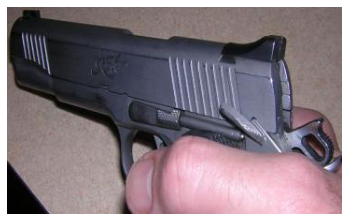

box [  4.496251    2.5374913 283.49646   404.8714   ]


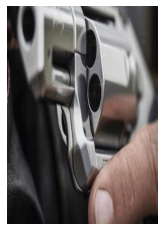

box [100.53679 117.91821 312.18518 285.67032]


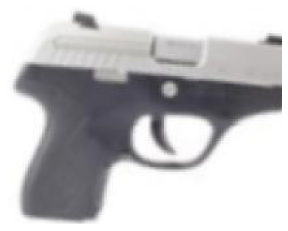

box [ 14.237483  14.101151 273.8786   272.97003 ]


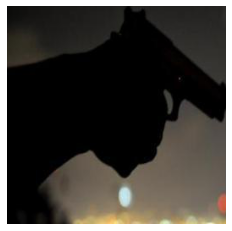

box [214.08919 232.07874 323.8708  408.376  ]


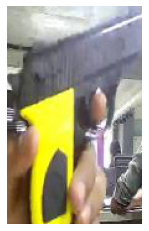

box [226.36572 127.61325 319.88763 366.76346]


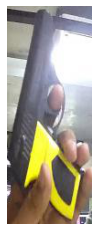

box [119.0776  109.03331 372.31174 343.17694]


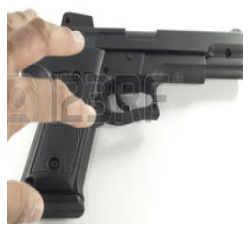

box [ 27.031136 174.50641  193.65794  383.13037 ]


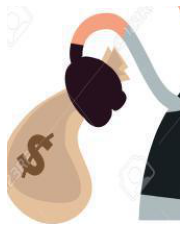

box [104.723976  60.54526  320.4267   358.79083 ]


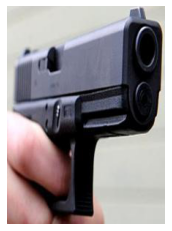

box [ 27.030287  34.273533 182.9923   253.15585 ]


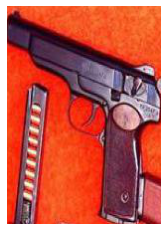

box [ 83.27729   51.098106 325.27167  370.6911  ]


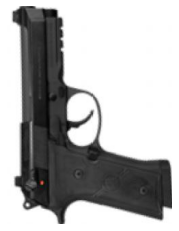

box [212.04317  99.54888 335.00912 288.2577 ]


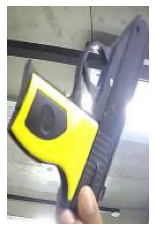

In [32]:
for imageName in randomImages:
  image = Image.open(imageName) 
  exist,crop_img,box = crop_object(image,imageName)
  if exist:
    print("box",box)
    plt.figure()
    plt.axis('off')
    plt.imshow(crop_img) 
    plt.show()    
    

# MontarDrive

In [25]:
import os
from google.colab import drive
ROOT_FOLDER='/content/'
ROOT_DRIVE_FOLDER=ROOT_FOLDER+'drive/'
drive.mount(ROOT_DRIVE_FOLDER)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [26]:
modelPath = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
modelPath

'./output/model_final.pth'

In [31]:
!cp --suffix=_v_$(date +"%y-%m-%d--%T")  ./output/model_final.pth /content/drive/MyDrive/tmf-person-data/models/detectron/gun-detection